In [1]:
import numpy as np
import os
import shutil
import time
import cv2
import dicom_global_params
import dicom_cat_params
from dicom_image_functions import show_images, save_images, split_images
import dicom_bit_functions as bf
import dicom_multithread_functions as mf
from lfsr import LFSR

# **Read plain images**

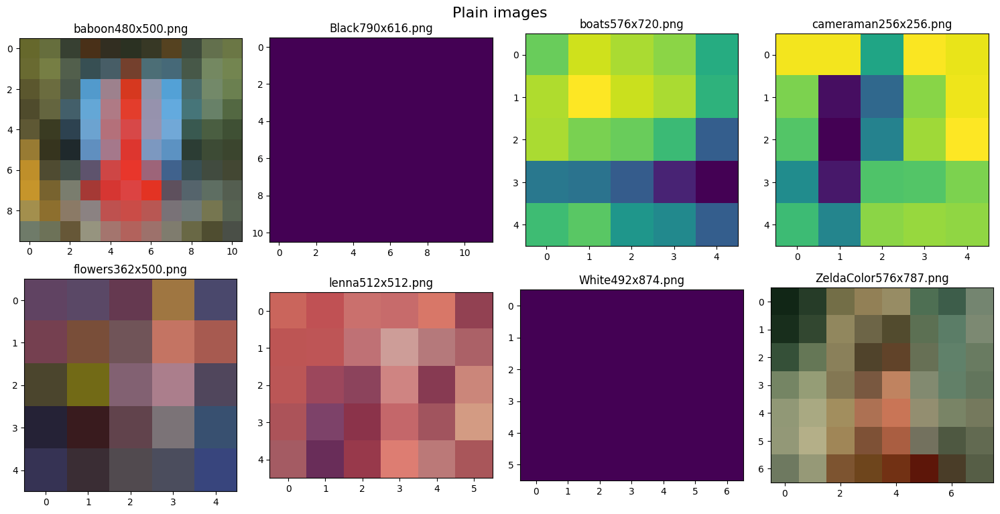

1. Images' sizes:  [[10, 11], [11, 12], [5, 5], [5, 5], [5, 5], [5, 6], [6, 7], [7, 8]]
2. Number of bits:  [24, 8, 8, 8, 24, 24, 8, 24]
3. Maximum number of pixels of an image:  132


In [2]:
list_os = ['Windows', 'Linux']
OS = list_os[0]
path = os.path.dirname(os.getcwd())
dir_plain = os.path.join(path, 'plain_images')
grey_image = [0, 1, 1, 1, 0, 0, 1, 0]

R_iterations = dicom_cat_params.R_iterations
im_base_size = 8

# List of images' sizes
list_im_size = []

# List of number of bits
list_num_bits_pre = []

# Read images
I_plains = os.listdir(dir_plain)
N_files = len(I_plains)
kI = []
str_Fnames = []

for i in range(0, N_files):
    size_0 = (im_base_size + i) % 10 + 2 if (im_base_size + i) % 10 + 2 > 4 else 5
    size_1 = (im_base_size + i) % 10 + 3 if (im_base_size + i) % 10 + 3 > 4 else 5
    size = (size_0,
            size_1)
    list_im_size.append([size[0], size[1]])

    name = I_plains[i]
    str_Fnames.append(name)
    if (grey_image[i] == 1):
        Ip = cv2.imread(dir_plain + '\\' + name if OS == 'Windows' else dir_plain + '/' + name, 0)
        Ip_resized = cv2.resize(Ip, (size[1], size[0]), interpolation = cv2.INTER_AREA)
        list_num_bits_pre.append(8)
        Ip_resized = np.uint8(Ip_resized)
        kI.append(Ip_resized)
    else:
        Ip = cv2.imread(dir_plain + '\\' + name if OS == 'Windows' else dir_plain + '/' + name)
        Ip_resized = cv2.resize(Ip, (size[1], size[0]), interpolation = cv2.INTER_AREA)
        list_num_bits_pre.append(24)
        (B, G, R) = np.uint32(cv2.split(Ip_resized))
        kI.append((B << 16) + (G << 8) + R)

# Show images
kI_merge = split_images(kI = kI, list_num_bits_pre = list_num_bits_pre)
show_images(kI = kI_merge, suptitle = 'Plain images', str_Fnames = str_Fnames, size = (15, 15), rows = 4, cols = 4)

# Destination folder
dir_cipher = os.path.join(path, 'cipher_images' + dicom_global_params.NamePCM)

for n in range(dicom_global_params.Ne):
    if (os.path.exists(dir_cipher + "_" + str(n))):
        shutil.rmtree(dir_cipher + "_" + str(n))
    os.mkdir(dir_cipher + "_" + str(n))

# Decrypted images folder
dir_decrypted = os.path.join(path, 'decrypted' + dicom_global_params.NamePCM)

if (os.path.exists(dir_decrypted)):
    shutil.rmtree(dir_decrypted)
os.mkdir(dir_decrypted)

# Images' sizes
print("1. Images' sizes: ", list_im_size)

# Number of bits
print("2. Number of bits: ", list_num_bits_pre)

# Maximum number of pixels of an image
max_picture = 0
for k in range(dicom_global_params.K):
    if (list_im_size[k][0] * list_im_size[k][1] > list_im_size[max_picture][0] * list_im_size[max_picture][1]):
        max_picture = k

max_num_pix = max([list_im_size[i][0] * list_im_size[i][1] for i in range(0, N_files)])
print("3. Maximum number of pixels of an image: ", max_num_pix)

# **Parameters**

In [3]:
# S0
S0 = str(np.binary_repr(dicom_global_params.S0).zfill(32))

# kC
kC = kI.copy()

#kC-
# kC_minus = np.copy(dicom_global_params.kC0)
kC_minus = []
for k in range(dicom_global_params.K):
    kC_minus.append([(dicom_global_params.kC0[k][0] & (2**list_num_bits_pre[k] - 1))])
kC_minus = np.asarray(kC_minus)

#kP+
# kP_plus = np.copy(dicom_global_params.kP0)
kP_plus = []

for i in range(dicom_global_params.K):
    kP_plus.append([kC[i][0][1]])
kP_plus = np.asarray(kP_plus)

print("1. S0: ", S0)
print("\n2. kC_minus: ", kC_minus)
print("\n3. kP_plus: ", kP_plus)

1. S0:  00010010001101000101011001111000

2. kC_minus:  [[    228]
 [    249]
 [     26]
 [     79]
 [    200]
 [1796771]
 [    205]
 [    155]]

3. kP_plus:  [[4025958]
 [      0]
 [    153]
 [    214]
 [6703194]
 [5525952]
 [    255]
 [2636838]]


# **Encryption**

In [4]:
print("---------------------------------------------------------")
print("\t\tEncryption Initial Parameters")
print("---------------------------------------------------------")

print("1. kC: \n", kC)
print("\n2. kC_minus: \n", kC_minus)
print("\n   kP_plus: \n", kP_plus)
print("\n3. S0: \n", S0)
print("\n\n")

print("=============================START ENCRYPTION PROCESSING=============================")

lfsr       = LFSR(seed=S0, taps=dicom_global_params.LFSR_POLY)
state      = lfsr.get_state()
XY         = [[0, 0] for k in range(dicom_global_params.K)]
list_n     = [0 for k in range(dicom_global_params.K)]
done       = [0 for k in range(dicom_global_params.K)]
last_state = ["" for k in range(dicom_global_params.K)]

for i in range(dicom_global_params.Ne * max_num_pix):
    print("\n------------------------")
    print("|      Iteration " + str(i) + "     |")
    print("------------------------")

    # E, SK, state
    E, SK, state = bf.session_key_scheduling(lfsr       = lfsr                          , 
                                             num_cycles = dicom_global_params.num_cycles )
    print("1. E: \n", E, "\n")
    print("2. SK: \n", SK, "\n")
    print("3. LFSR's state: \n", state, "\n")

    # Saving last states
    last_state = bf.save_lfsr_state(state        = state     , 
                                    done         = done      ,
                                    last_state   = last_state )

    # PCM Cat
    X_R = bf.pcm_cat(E                  = E                                  , 
                     Y_Gamma_0_FAST_Cat = dicom_cat_params.Y_Gamma_0_FAST_Cat, 
                     Y_X_0_FAST_Cat     = dicom_cat_params.Y_X_0_FAST_Cat    , 
                     Y_FAST_Cat         = dicom_cat_params.Y_FAST_Cat        , 
                     R                  = R_iterations                        )
    print("4. X_R: \n", X_R, "\n")

    # XY, phi generation
    XY_new, phi_source, phi_dest = bf.xy_phi_generation(X_R                      = X_R                                      , 
                                                        SK                       = SK                                       , 
                                                        kP_plus                  = kP_plus                                  , 
                                                        kC_minus                 = kC_minus                                 , 
                                                        phi_source_base_position = dicom_cat_params.phi_source_base_position, 
                                                        phi_dest_base_position   = dicom_cat_params.phi_dest_base_position  , 
                                                        i_base_position          = dicom_cat_params.i_base_position         , 
                                                        j_base_position          = dicom_cat_params.j_base_position          )
    print("5. XY_new: \n", XY_new, "\n")
    print("6. phi_source: \n", phi_source, "\n")
    print("7. phi_dest: \n", phi_dest, "\n")

    # Bit Pre-processing for all images
    XY_P, phi_source_P, phi_dest_P = mf.bit_pre_processing_mt(XY                = XY               , 
                                                              XY_new            = XY_new           , 
                                                              phi_source        = phi_source       , 
                                                              phi_dest          = phi_dest         , 
                                                              list_im_size      = list_im_size     , 
                                                              list_num_bits_pre = list_num_bits_pre )
    print("8. XY_P: \n", XY_P, "\n")
    print("9. phi_source_P: \n", phi_source_P, "\n")
    print("10. phi_dest_P: \n", phi_dest_P, "\n")

    # Permutation and Diffusion for Encryption process
    XY, kC_minus, kP_plus, kC = bf.dicom_mie_perm_diff_enc(kI                = kC                      , 
                                                           XY                = XY                      , 
                                                           XY_P              = XY_P                    , 
                                                           phi_source_P      = phi_source_P            , 
                                                           phi_dest_P        = phi_dest_P              , 
                                                           prev_kP_plus      = kP_plus                 , 
                                                           kC_minus          = kC_minus                , 
                                                           Sbox              = dicom_global_params.Sbox, 
                                                           list_im_size      = list_im_size            , 
                                                           list_num_bits_pre = list_num_bits_pre       , 
                                                           list_n            = list_n                  , 
                                                           done              = done                    , 
                                                           dir_cipher        = dir_cipher              , 
                                                           str_Fnames        = str_Fnames              , 
                                                           grey_image        = grey_image               )
    print("\n11. XY: \n", XY)
    print("\n12. list_n: \n", list_n)
    print("\n13. kC_minus: \n", kC_minus)
    print("\n14. kP_plus: \n", kP_plus)
    print("\n15. kC: \n", kC)
    print("\n16. Done: \n", done)
    
    print("\n17. Last states: \n", last_state)

    end_time = time.time() # Record end time in senconds unit



---------------------------------------------------------
		Encryption Initial Parameters
---------------------------------------------------------
1. kC: 
 [array([[ 2910310,  4025958,  3293239,  1585225,  2174514,  2240811,
         2439223,  2114133,  3885373,  5075043,  4552555],
       [ 3238505,  4488822,  5005138,  5459767,  6708551,  2965620,
         7761484,  7891270,  4741191,  6391924,  5277043],
       [ 3037019,  4156523,  4872010, 13408850,  9273757,  2046166,
        11244941, 14066003,  7105610,  6916467,  5275755],
       [ 2902863,  4154724,  6971203, 14067556,  8747695,  2899427,
        11375254, 14592611,  7959878,  6848872,  4352083],
       [ 3430494,  2243386,  5259821, 13673324,  8024244,  4737239,
        11506583, 14133361,  5265721,  4283978,  3428415],
       [ 3373976,  1979446,  2894111, 12554080,  9140389,  3094237,
        12621948, 12751452,  3423532,  3492669,  3032379],
       [ 2789311,  3230543,  4936004,  7164766,  4540110,  2832104,
         795

# **Read cipher image**

1. Images' sizes:  [[10, 11], [11, 12], [5, 5], [5, 5], [5, 5], [5, 6], [6, 7], [7, 8]]
2. Number of bits:  [24, 8, 8, 8, 24, 24, 8, 24]
3. Maximum number of pixels of an image:  132


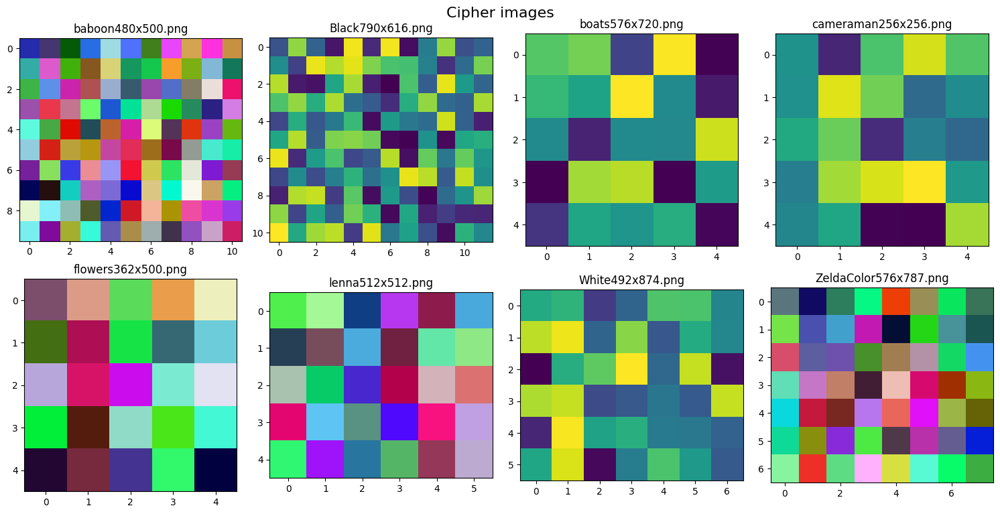

5. kC_cipher_minus:  [[13083592]
 [     159]
 [     159]
 [      22]
 [ 7075890]
 [ 5846932]
 [     142]
 [ 6945544]]
6. kP_cipher_plus:  [[   172]
 [     1]
 [   242]
 [   173]
 [    26]
 [382155]
 [   240]
 [   232]]


In [5]:
# Read images
I_ciphers = os.listdir(dir_cipher + "_" + str(dicom_global_params.Ne - 1))
N_files = len(I_ciphers)
kI_cipher = []
str_Fnames_cipher = str_Fnames.copy()

# Images' sizes
print("1. Images' sizes: ", list_im_size)

# Number of bits
print("2. Number of bits: ", list_num_bits_pre)

# Maximum number of pixels of an image
max_num_pix = max([list_im_size[i][0] * list_im_size[i][1] for i in range(0, N_files)])
print("3. Maximum number of pixels of an image: ", max_num_pix)

for i in range(0, N_files):
    name = I_ciphers[i]
    if (grey_image[i] == 1):
        Ip = cv2.imread(dir_cipher + "_" + str(dicom_global_params.Ne - 1) + '\\' + name if OS == 'Windows' else dir_cipher + "_" + str(dicom_global_params.Ne - 1) + '/' + name, cv2.IMREAD_ANYDEPTH)
        Ip_resized = cv2.resize(Ip, (list_im_size[i][1], list_im_size[i][0]), interpolation = cv2.INTER_AREA)
        Ip_resized = np.uint8(Ip_resized)
        kI_cipher.append(Ip_resized)
    else:
        Ip = cv2.imread(dir_cipher + "_" + str(dicom_global_params.Ne - 1) + '\\' + name if OS == 'Windows' else dir_cipher + "_" + str(dicom_global_params.Ne - 1) + '/' + name, cv2.IMREAD_UNCHANGED)
        Ip_bgr = cv2.cvtColor(Ip, cv2.COLOR_BGRA2BGR)
        Ip_resized = cv2.resize(Ip, (list_im_size[i][1], list_im_size[i][0]), interpolation = cv2.INTER_AREA)
        (B, G, R) = np.uint32(cv2.split(Ip_resized))
        kI_cipher.append((B << 16) + (G << 8) + R)

# Show images
kI_cipher_merge = split_images(kI = kI_cipher, list_num_bits_pre = list_num_bits_pre)
show_images(kI = kI_cipher_merge, suptitle = 'Cipher images', str_Fnames = str_Fnames_cipher, size = (15, 15), rows = 4, cols = 4)

# kC_cipher
kC_cipher = kI_cipher.copy()

#kC_cipher-
kC_cipher_minus = []

for k in range(dicom_global_params.K):
    kC_cipher_minus.append([kC_cipher[k][list_im_size[k][0]-1][list_im_size[k][1]-2]])
kC_cipher_minus = np.asarray(kC_cipher_minus)

#kP_cipher+
kP_cipher_plus = []

for k in range(dicom_global_params.K):
    kP_cipher_plus.append([(dicom_global_params.kP0[k][0] & (2**list_num_bits_pre[k] - 1))])
kP_cipher_plus = np.asarray(kP_cipher_plus)

print("5. kC_cipher_minus: ", kC_cipher_minus)
print("6. kP_cipher_plus: ", kP_cipher_plus)

# **Decryption for Single Image**

---------------------------------------------------------
		Decryption Initial Parameters
---------------------------------------------------------
1. kC_cipher[0]: 
 [[11349028  7353669   481797 14904616 14867614 16478543  1867584 16336361
   5285076 14627326  4362696]
 [10923060 13392604   766272  2054277  7787479  6133525  5097238  2924022
   1355643 14071937  5863443]
 [ 4699198 15306844 11281355  5329325 13610394  7297592 11356057 13135442
   6651268 14212843  7147758]
 [11293083  4995305  9467077  7076715 13784862  9888002  9690029   121368
   6196005  8528171 15039956]
 [14547550  4499782   134111  5786912  2974651 10952662  7994332  5649491
    931039 12862107  1161063]
 [14667154  1385171  3776955  1021878 10569667  5778914  1863069  4786808
   9608083 13494855 11005206]
 [10035574  6086792 15153721  9800940 16225689  3281651  5163727  6480940
  14280932 13834878  5585558]
 [ 5768448   921125 12700948 12673197 14051708 13568521  8636124 13629443
  15595769  6529996  8580612]
 

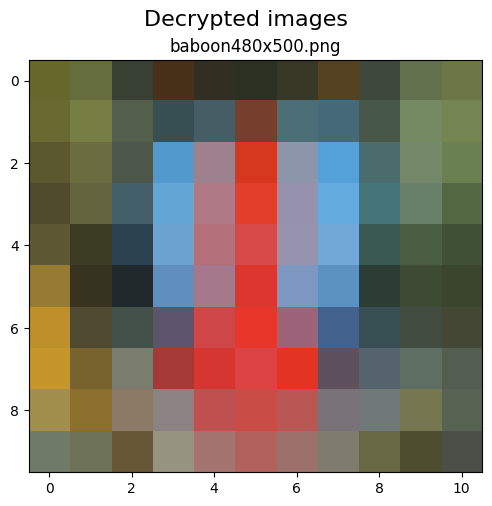

In [6]:
print("---------------------------------------------------------")
print("\t\tDecryption Initial Parameters")
print("---------------------------------------------------------")

# Order of image user want to decrypt
k = 0

# kC_cipher_minus
kC_cipher_minus_k = []

# kP_cipher_plus
kP_cipher_plus_k = []

# kC_cipher_k
kC_cipher_k = []

kC_cipher_minus_k.append(kC_cipher_minus[k][0])
kP_cipher_plus_k.append(kP_cipher_plus[k][0])
kC_cipher_k = kC_cipher[k].copy()

state_k = last_state[k]

print("1. kC_cipher[" + str(k) + "]: \n", kC_cipher_k)
print("\n2. kC_cipher_minus: \n", kC_cipher_minus_k)
print("\n3. kP_cipher_plus: \n", kP_cipher_plus_k)
print("\n4. S0: \n", S0)
print("\n5. E: \n", E)
print("\n6. State of LFSR: \n", state_k)
print("\n\n")

print("=============================START DECRYPTION PROCESSING=============================")

# lfsr = LFSR(fpoly=dicom_global_params.LFSR_POLY_INV, initstate=state_k, conf=dicom_global_params.TYPE_LFSR)
lfsr = LFSR(seed=state_k, taps=dicom_global_params.LFSR_POLY_INV)
XY_k = [list_im_size[k][0] - 1, list_im_size[k][1] - 1]

for n in range(dicom_global_params.Ne - 1, -1, -1):
    start_time = time.time() # Record start time in seconds unit
    print("\n")
    print("\t---------------------------------------------------------")
    print("\t-------------------|      STEP ",n,"   |-------------------")
    print("\t---------------------------------------------------------\n")
    for i in range(list_im_size[k][0] * list_im_size[k][1] - 1, -1, -1):
        print("\n------------------------")
        print("|      Iteration " + str(i) + "     |")
        print("------------------------")

        # E, sk_k, state
        E, sk_k, state_k = bf.session_key_scheduling_dec_k(lfsr       = lfsr                          , 
                                                           num_cycles = dicom_global_params.num_cycles, 
                                                           k          = k                              )
        print("\n1. E: \n", E, "\n")
        print("\n2. sk_k: \n", sk_k, "\n")
        print("\n3. LFSR's state: \n", state_k, "\n")

        # PCM Cat
        X_R = bf.pcm_cat(E                  = E                                  , 
                         Y_Gamma_0_FAST_Cat = dicom_cat_params.Y_Gamma_0_FAST_Cat, 
                         Y_X_0_FAST_Cat     = dicom_cat_params.Y_X_0_FAST_Cat    , 
                         Y_FAST_Cat         = dicom_cat_params.Y_FAST_Cat        , 
                         R                  = R_iterations                        )
        print("4. X_R: \n", X_R, "\n")

        # XY, phi generation
        XY_new_k, phi_source_k, phi_dest_k = bf.xy_phi_generation_k(k                          = k                                              , 
                                                                    X_R                        = X_R                                            , 
                                                                    sk_k                       = sk_k[0]                                        , 
                                                                    kP_plus_k                  = kP_cipher_plus_k                               , 
                                                                    kC_minus_k                 = kC_cipher_minus_k                              , 
                                                                    phi_source_base_position_k = dicom_cat_params.phi_source_base_position + 2*k, 
                                                                    phi_dest_base_position_k   = dicom_cat_params.phi_dest_base_position   + 2*k, 
                                                                    i_base_position_k          = dicom_cat_params.i_base_position          + 2*k, 
                                                                    j_base_position_k          = dicom_cat_params.j_base_position          + 2*k )
        print("5. k: \n", k, "\n")
        print("6. XY_new_k: \n", XY_new_k, "\n")
        print("7. phi_source_k: \n", phi_source_k, "\n")
        print("8. phi_dest_k: \n", phi_dest_k, "\n")

        # Bit Pre-processing for all images
        XY_Pk, phi_source_Pk, phi_dest_Pk = bf.bit_pre_processing_k(XY_k           = XY_k                , 
                                                                    XY_new_k       = XY_new_k            , 
                                                                    phi_source_k   = phi_source_k        , 
                                                                    phi_dest_k     = phi_dest_k          , 
                                                                    M_k            = list_im_size[k][0]  , 
                                                                    N_k            = list_im_size[k][1]  , 
                                                                    num_bits_pre_k = list_num_bits_pre[k] )
        print("9. XY_Pk: \n", XY_Pk, "\n")
        print("10. phi_source_Pk: \n", phi_source_Pk, "\n")
        print("11. phi_dest_Pk: \n", phi_dest_Pk, "\n")

        # Permutation and Diffusion for Encryption process
        XY_k, kC_cipher_minus_k, kP_cipher_plus_k, kC_cipher_k = bf.dicom_mie_perm_diff_dec_mc_k(k                 = k                           , 
                                                                                                 kC                = kC_cipher_k                 , 
                                                                                                 XY_k              = XY_k                        , 
                                                                                                 XY_Pk             = XY_Pk                       , 
                                                                                                 phi_source_Pk     = phi_source_Pk               , 
                                                                                                 phi_dest_Pk       = phi_dest_Pk                 , 
                                                                                                 kC_minus_k        = kC_cipher_minus_k           , 
                                                                                                 M_k               = list_im_size[k][0]          , 
                                                                                                 N_k               = list_im_size[k][1]          , 
                                                                                                 num_bits_pre_k    = list_num_bits_pre[k]        , 
                                                                                                 Sbox              = dicom_global_params.Sbox_inv, 
                                                                                                 n                 = n                            )
        print("\n12. XY_k: \n", XY_k)
        print("\n13. kC_cipher_minus_k: \n", kC_cipher_minus_k)
        print("\n14. kP_cipher_plus_k: \n", kP_cipher_plus_k)
        print("\n15. kC_cipher_k: \n", kC_cipher_k)

    end_time = time.time() # Record end time in senconds unit
    print("Simulation time of step ", n, ": ", end_time - start_time)

kC_cipher_k_merge = split_images(kI                = [kC_cipher_k]         , 
                                 list_num_bits_pre = [list_num_bits_pre[k]] )

save_images(kC_cipher_k_merge, dir_decrypted, [str_Fnames_cipher[k]], [grey_image[k]])
show_images(kI = kC_cipher_k_merge, suptitle = 'Decrypted images', str_Fnames = [str_Fnames_cipher[k]], 
            size = (5, 5), rows = 1, cols = 1)

# **Decryption for All Images**

---------------------------------------------------------
		Decryption Initial Parameters
---------------------------------------------------------
1. kC_cipher: 
 [array([[11349028,  7353669,   481797, 14904616, 14867614, 16478543,
         1867584, 16336361,  5285076, 14627326,  4362696],
       [10923060, 13392604,   766272,  2054277,  7787479,  6133525,
         5097238,  2924022,  1355643, 14071937,  5863443],
       [ 4699198, 15306844, 11281355,  5329325, 13610394,  7297592,
        11356057, 13135442,  6651268, 14212843,  7147758],
       [11293083,  4995305,  9467077,  7076715, 13784862,  9888002,
         9690029,   121368,  6196005,  8528171, 15039956],
       [14547550,  4499782,   134111,  5786912,  2974651, 10952662,
         7994332,  5649491,   931039, 12862107,  1161063],
       [14667154,  1385171,  3776955,  1021878, 10569667,  5778914,
         1863069,  4786808,  9608083, 13494855, 11005206],
       [10035574,  6086792, 15153721,  9800940, 16225689,  3281651,
     

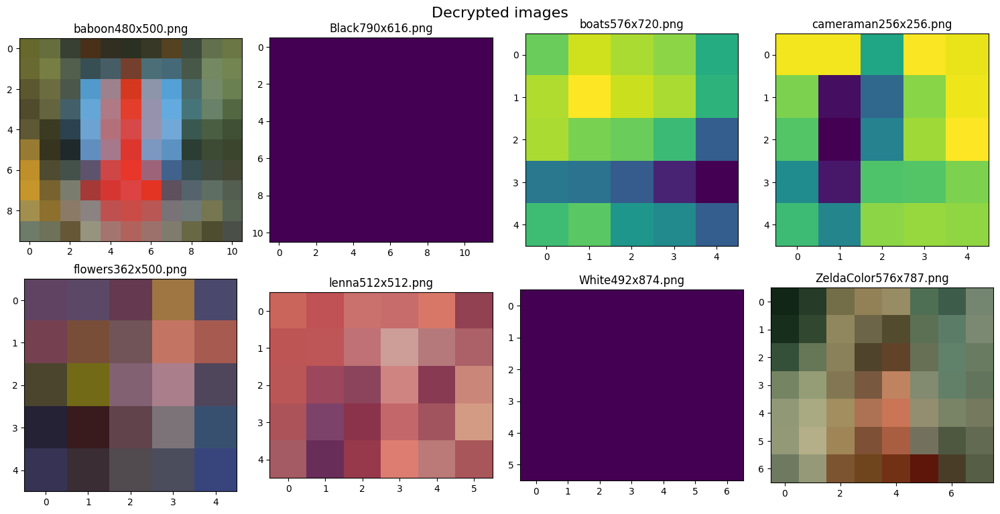

In [7]:
print("---------------------------------------------------------")
print("\t\tDecryption Initial Parameters")
print("---------------------------------------------------------")

print("1. kC_cipher: \n", kC_cipher)
print("\n2. kC_cipher_minus: \n", kC_cipher_minus)
print("\n3. kP_cipher_plus: \n", kP_cipher_plus)
print("\n4. S0: \n", S0)
print("\n5. E: \n", E)
print("\n6. States of LFSR: \n", last_state)

print("\n\n")

print("=============================START DECRYPTION PROCESSING=============================")
# lfsr = LFSR(fpoly=dicom_global_params.LFSR_POLY_INV, initstate=state_k, conf=dicom_global_params.TYPE_LFSR)
lfsr   = LFSR(seed=last_state[max_picture], taps=dicom_global_params.LFSR_POLY_INV)
XY     = [[list_im_size[k][0] - 1, list_im_size[k][1] - 1] for k in range(dicom_global_params.K)]
list_n = [(dicom_global_params.Ne - 1) for k in range(dicom_global_params.K)]
done   = [0 for k in range(dicom_global_params.K)]

# for n in range(dicom_global_params.Ne - 1, -1, -1):
#     start_time = time.time() # Record start time in seconds unit
#     print("\n")
#     print("\t---------------------------------------------------------")
#     print("\t-------------------|      STEP ",n,"   |-------------------")
#     print("\t---------------------------------------------------------\n")
for i in range(dicom_global_params.Ne * max_num_pix - 1, -1, -1):
    print("\n------------------------")
    print("|      Iteration " + str(i) + "     |")
    print("------------------------")

    # E, SK, state
    E, SK, state = bf.session_key_scheduling_dec(lfsr       = lfsr                          , 
                                                 num_cycles = dicom_global_params.num_cycles)
    print("\n1. E: \n", E, "\n")
    print("\n2. SK: \n", SK, "\n")
    print("\n3. LFSR's state: \n", state, "\n")

    # PCM Cat
    X_R = bf.pcm_cat(E                  = E                                  , 
                     Y_Gamma_0_FAST_Cat = dicom_cat_params.Y_Gamma_0_FAST_Cat, 
                     Y_X_0_FAST_Cat     = dicom_cat_params.Y_X_0_FAST_Cat    , 
                     Y_FAST_Cat         = dicom_cat_params.Y_FAST_Cat        , 
                     R                  = R_iterations                        )
    print("4. X_R: \n", X_R, "\n")

    # XY, phi generation
    XY_new, phi_source, phi_dest = bf.xy_phi_generation(X_R                        = X_R                                      , 
                                                        SK                         = SK                                       , 
                                                        kP_plus                    = kP_cipher_plus                           , 
                                                        kC_minus                   = kC_cipher_minus                          , 
                                                        phi_source_base_position   = dicom_cat_params.phi_source_base_position, 
                                                        phi_dest_base_position     = dicom_cat_params.phi_dest_base_position  , 
                                                        i_base_position            = dicom_cat_params.i_base_position         , 
                                                        j_base_position            = dicom_cat_params.j_base_position          )
    print("5. XY_new: \n", XY_new, "\n")
    print("6. phi_source: \n", phi_source, "\n")
    print("7. phi_dest: \n", phi_dest, "\n")

    # Bit Pre-processing for all images
    XY_P, phi_source_P, phi_dest_P = mf.bit_pre_processing_mt(XY                = XY                , 
                                                              XY_new            = XY_new            , 
                                                              phi_source        = phi_source        , 
                                                              phi_dest          = phi_dest          , 
                                                              list_im_size      = list_im_size      , 
                                                              list_num_bits_pre = list_num_bits_pre  )
    print("8. XY_P: \n", XY_P, "\n")
    print("9. phi_source_P: \n", phi_source_P, "\n")
    print("10. phi_dest_P: \n", phi_dest_P, "\n")

    # Permutation and Diffusion for Encryption process
    XY, kC_cipher_minus, kP_cipher_plus, kC_cipher = bf.dicom_mie_perm_diff_dec(kC                = kC_cipher                   , 
                                                                                XY                = XY                          , 
                                                                                XY_P              = XY_P                        , 
                                                                                phi_source_P      = phi_source_P                , 
                                                                                phi_dest_P        = phi_dest_P                  , 
                                                                                prev_kP_plus      = kP_cipher_plus              , 
                                                                                kC_minus          = kC_cipher_minus             , 
                                                                                Sbox              = dicom_global_params.Sbox_inv, 
                                                                                list_im_size      = list_im_size                , 
                                                                                list_num_bits_pre = list_num_bits_pre           , 
                                                                                list_n            = list_n                      , 
                                                                                iter              = i                           , 
                                                                                done              = done                         )
    print("\n11. XY: \n", XY)
    print("\n12. list_n: \n", list_n)
    print("\n13. kC_cipher_minus: \n", kC_cipher_minus)
    print("\n14. kP_cipher_plus: \n", kP_cipher_plus)
    print("\n15. kC_cipher: \n", kC_cipher)
    print("\n16. done: \n", done)

    # end_time = time.time() # Record end time in senconds unit
    # print("Simulation time of step ", n, ": ", end_time - start_time)

kC_cipher_merge = split_images(kI                = kC_cipher        , 
                               list_num_bits_pre = list_num_bits_pre )

save_images(kC_cipher_merge, dir_decrypted, str_Fnames_cipher, grey_image)
show_images(kI = kC_cipher_merge, suptitle = 'Decrypted images', str_Fnames = str_Fnames_cipher, 
            size = (15, 15), rows = 4, cols = 4)